In [2]:
#importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #to adjust the configuration of the plots

In [9]:
#reading the dataset into pandas dataframe
df = pd.read_csv(r'C:\Users\aveda\OneDrive\Desktop\myPlayGround\Data Science\projects\DataAnalyst_Portfolio\Movie Industry Data Analysis\Dataset\movies.csv')

In [10]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [11]:
#First step is to clean the data. i.e., checking the data types, removing the null values, removing the duplicates

In [16]:
#Checking for null or missing values in data frame
for i in df.columns:
    p_missing = np.mean(df[i].isnull())
    print('{} - {}%'.format(i, p_missing))
    

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [20]:
#There are some null values in everything except name,genre,year and director
#lets count the null values for each column
null_counts = df.isnull().sum()
print(null_counts)

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64


In [21]:
#Lets handle the null values. I can straight away remove/drop those columns from the datafram Or i can fill those values with 0's or mean.
#In this case, as the null values are in high proportion i decided to fill them with 0 or mean

In [22]:
skewness = df['budget'].skew()
print('Skewness of budget:', skewness)

Skewness of budget: 2.453513476195313


In [27]:
#Because it is heavily skewed, i cannot fill the missing values with either mean/median without using any data transformations.
#Therefore i decided to go with dropping the null value rows
df_dropped = df.dropna(subset=['budget', 'gross','rating','released','score','votes','writer','star','country','runtime','company'])

In [28]:
df_dropped.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [29]:
#Checking whether the drop was successful or not
for i in df_dropped.columns:
    p_missing = np.mean(df_dropped[i].isnull())
    print('{} - {}%'.format(i, p_missing))

name - 0.0%
rating - 0.0%
genre - 0.0%
year - 0.0%
released - 0.0%
score - 0.0%
votes - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
budget - 0.0%
gross - 0.0%
company - 0.0%
runtime - 0.0%


In [33]:
#Checking for datatypes
df_dropped.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object

In [32]:
#converting gross and budget to int types because we dont need them to be float or theyre not floating type values.
df_dropped.loc[:, 'budget'] = df_dropped['budget'].astype('int64')
df_dropped.loc[:, 'gross'] = df_dropped['gross'].astype('int64')

In [42]:
#Some of the rows in year column do not match with year in realease date column. So we will fix it by matching them
df_dropped.loc[:, 'corrected_year'] = df['released'].astype(str).str.extract(r'(\d{4})', expand=False)

In [43]:
df_dropped.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,corrected_year
0,The Shining,R,Drama,1980.0,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980.0,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980.0,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980.0,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980.0,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0,1980


In [46]:
df_dropped.sort_values(by = ['gross'], inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,corrected_year
5445,Avatar,PG-13,Action,2009.0,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019.0,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997.0,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015.0,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018.0,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019.0,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000.0,1.670728e+09,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015.0,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000.0,1.670516e+09,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012.0,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000.0,1.518816e+09,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015.0,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000.0,1.515341e+09,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019.0,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000.0,1.450027e+09,Walt Disney Animation Studios,103.0,2019


In [45]:
pd.set_option('display.max_rows', None)

In [47]:
#Dropping the duplicates
df_dropped['company'].drop_duplicates().sort_values(ascending=False)

7129                                                        thefyzz
5664                                                    micro_scope
4007                                                       i5 Films
6793                                                     i am OTHER
6420                                                           erbp
3776                                                 double A Films
3330                                    Zucker Brothers Productions
146                                                Zoetrope Studios
2213                                             Zeta Entertainment
3698                                        Zentropa Entertainments
1180                                           Zenith Entertainment
5180                                                Zazen Produções
1321                                       Zanuck/Brown Productions
1329                                    Zacharias-Buhai Productions
789                                       Young 

In [48]:
df_dropped.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,corrected_year
0,The Shining,R,Drama,1980.0,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,4.699877e+07,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980.0,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,5.885311e+07,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980.0,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,5.383751e+08,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980.0,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,8.345354e+07,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980.0,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,3.984634e+07,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980.0,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000.0,3.975460e+07,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980.0,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000.0,1.152299e+08,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980.0,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000.0,2.340243e+07,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980.0,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000.0,1.081857e+08,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980.0,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000.0,1.579519e+07,United Artists,100.0,1980


In [49]:
#I am thinking that Budget, Company, Star, Director High correlation with gross earning

<Figure size 500x400 with 0 Axes>

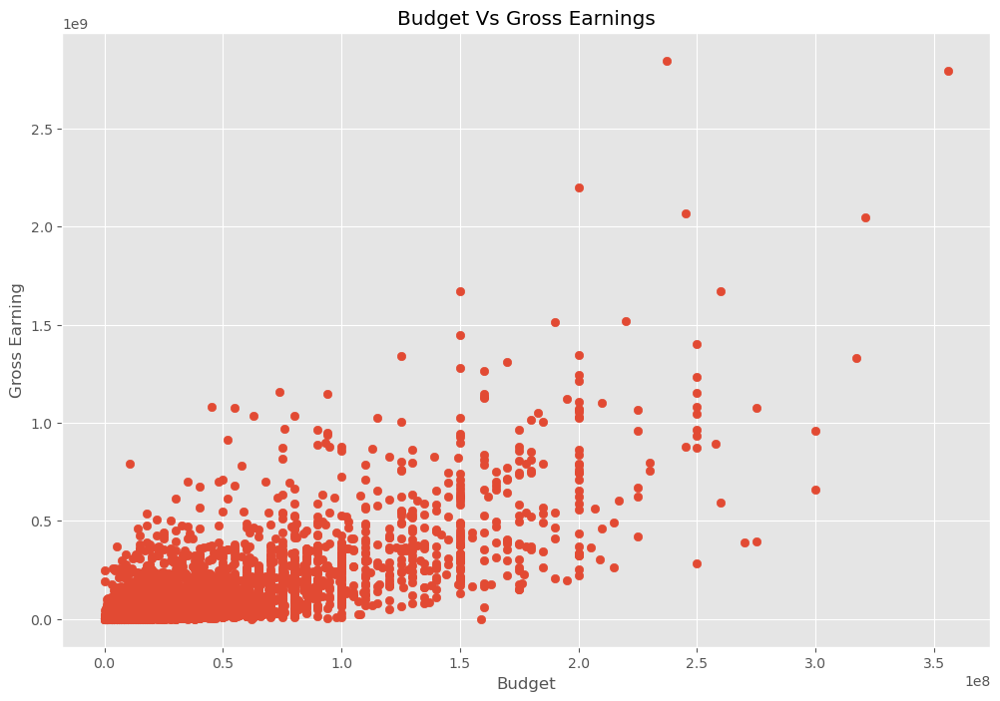

<Figure size 500x400 with 0 Axes>

In [52]:
#Scattar plot to checking if its correlated
#Budget vs Gross
plt.scatter(x = df_dropped['budget'], y = df_dropped['gross'])
plt.title('Budget Vs Gross Earnings')
plt.xlabel('Budget')
plt.ylabel('Gross Earning')
plt.figure(figsize=(5,4))

<Axes: xlabel='budget', ylabel='gross'>

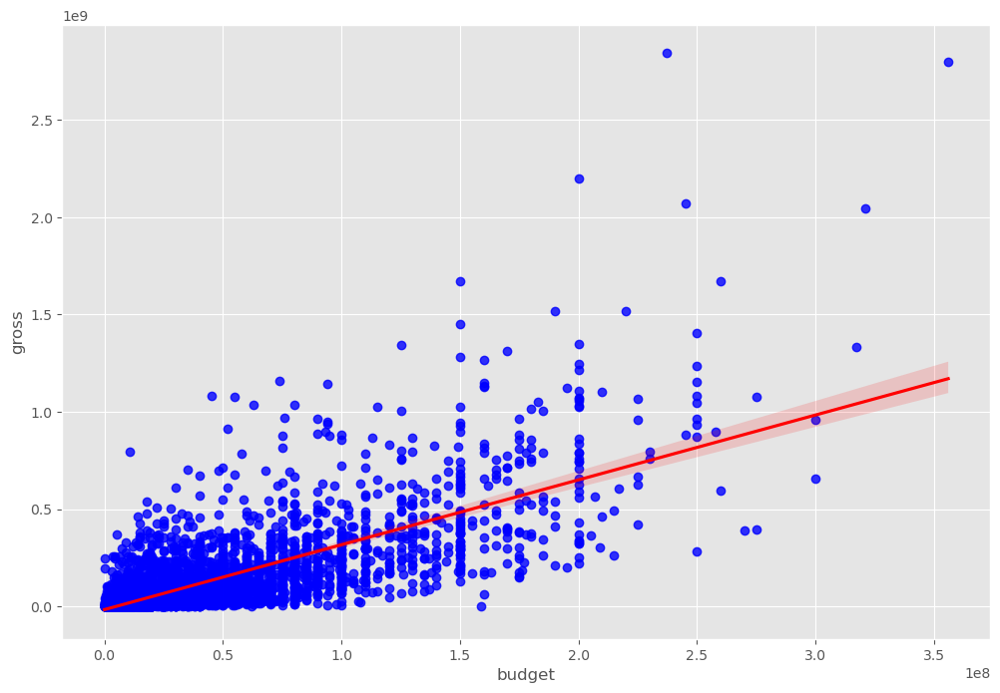

In [55]:
#Seems correlated but let's understand it better by drawing a plot using seaborn reg plot
sns.regplot(x = 'budget', y = 'gross', data = df_dropped, scatter_kws = {"color": "blue"}, line_kws = {"color": "red"})

In [61]:
#It is +vely correlated
#Now lets look at correlation for numerical values
#Excluding non-numeric columns
numeric_columns = df_dropped.select_dtypes(include=['float64', 'int64']).columns
df_dropped[numeric_columns].corr(method = 'pearson') #we can use pearson, kendall, spearman by default it is pearson

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


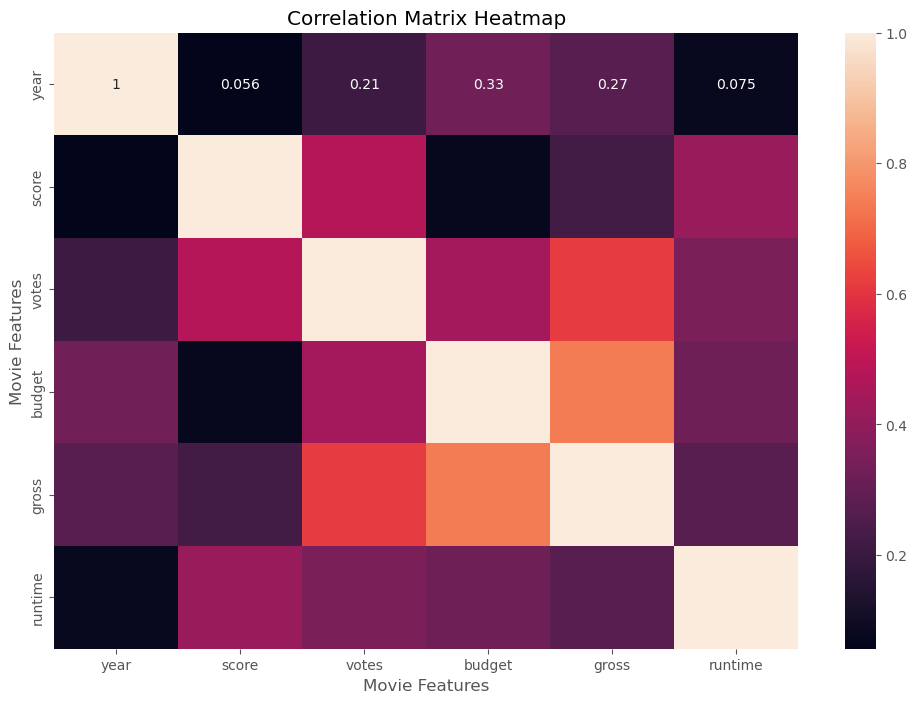

<Figure size 1200x800 with 0 Axes>

In [84]:
#By looking at above data, we can say that budget and votes are highly correlated
corr_matrix = df_dropped[numeric_columns].corr(method = 'pearson')
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Matrix Heatmap')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.figure(figsize=(12, 8))
plt.show()


In [88]:
#we can see that budget and votes have positive correlation
#lets try a calculation on non-numeric data
df_numerized = df_dropped
for i in df_numerized.columns:
    if(df_numerized[i].dtype == 'object'):
        df_numerized.iloc[:, i] = df_numerized[i].astype('category')
        df_numerized.iloc[:, i] = df_numerized[i].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,corrected_year
0,4692,6,6,1980.0,1304,8.4,927000.0,1795,2832,699,46,19000000.0,4.699877e+07,1426,146.0,0
1,3929,6,1,1980.0,1127,5.8,65000.0,1578,1158,214,47,4500000.0,5.885311e+07,452,104.0,0
2,3641,4,0,1980.0,1359,8.7,1200000.0,757,1818,1157,47,18000000.0,5.383751e+08,945,124.0,0
3,204,4,4,1980.0,1127,7.7,221000.0,889,1413,1474,47,3500000.0,8.345354e+07,1108,88.0,0
4,732,6,4,1980.0,1170,7.3,108000.0,719,351,271,47,6000000.0,3.984634e+07,1083,98.0,0
5,1509,6,9,1980.0,1922,6.4,123000.0,1758,3081,155,47,550000.0,3.975460e+07,1108,95.0,0
6,3930,6,0,1980.0,1359,7.9,188000.0,974,576,860,47,27000000.0,1.152299e+08,1397,133.0,0
7,3122,6,3,1980.0,530,8.2,330000.0,1269,1257,1469,47,18000000.0,2.340243e+07,390,129.0,0
8,3732,4,0,1980.0,1346,6.8,101000.0,1606,1402,595,47,54000000.0,1.081857e+08,548,127.0,1
9,4401,6,3,1980.0,1755,7.0,10000.0,2011,280,402,47,10000000.0,1.579519e+07,1391,100.0,0


In [89]:
df_dropped.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,corrected_year
0,4692,6,6,1980.0,1304,8.4,927000.0,1795,2832,699,46,19000000.0,46998772.0,1426,146.0,0
1,3929,6,1,1980.0,1127,5.8,65000.0,1578,1158,214,47,4500000.0,58853106.0,452,104.0,0
2,3641,4,0,1980.0,1359,8.7,1200000.0,757,1818,1157,47,18000000.0,538375067.0,945,124.0,0
3,204,4,4,1980.0,1127,7.7,221000.0,889,1413,1474,47,3500000.0,83453539.0,1108,88.0,0
4,732,6,4,1980.0,1170,7.3,108000.0,719,351,271,47,6000000.0,39846344.0,1083,98.0,0


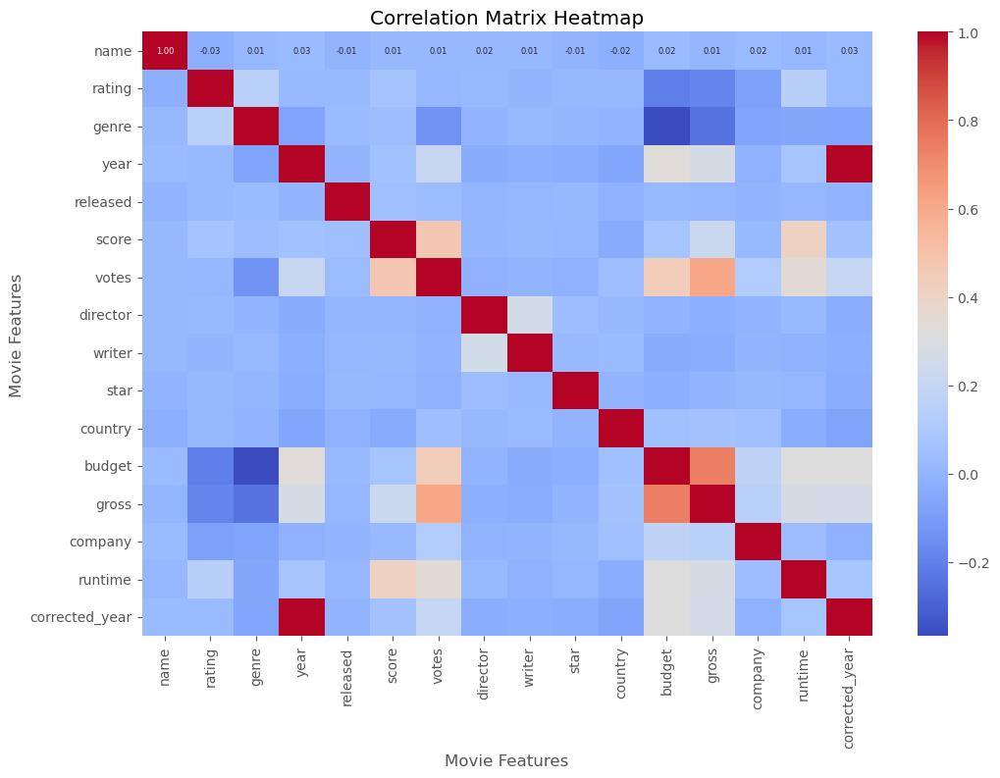

<Figure size 1200x800 with 0 Axes>

In [97]:
#Looking at non numerical data that was converted to categorical
corr_matrix1 = df_numerized.corr(method = 'pearson')
sns.heatmap(corr_matrix1, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={'size': 6})
plt.title('Correlation Matrix Heatmap')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.figure(figsize=(12, 8))
plt.show()


In [99]:
co_mat = df_numerized.corr()

In [100]:
co_pairs = co_mat.unstack()

In [101]:
co_pairs

name            name              1.000000
                rating           -0.027158
                genre             0.011516
                year              0.025542
                released         -0.005596
                score             0.014450
                votes             0.012615
                director          0.015801
                writer            0.013437
                star             -0.006322
                country          -0.024068
                budget            0.023392
                gross             0.005639
                company           0.022364
                runtime           0.010850
                corrected_year    0.026215
rating          name             -0.027158
                rating            1.000000
                genre             0.149109
                year              0.019499
                released          0.019973
                score             0.065983
                votes             0.006031
           

In [102]:
sorted = co_pairs.sort_values()
sorted

genre           budget           -0.368523
budget          genre            -0.368523
gross           genre            -0.244101
genre           gross            -0.244101
rating          budget           -0.203946
budget          rating           -0.203946
rating          gross            -0.181906
gross           rating           -0.181906
votes           genre            -0.135990
genre           votes            -0.135990
company         rating           -0.089582
rating          company          -0.089582
year            genre            -0.073167
genre           year             -0.073167
corrected_year  country          -0.071704
country         corrected_year   -0.071704
genre           company          -0.070640
company         genre            -0.070640
genre           corrected_year   -0.068443
corrected_year  genre            -0.068443
country         year             -0.066748
year            country          -0.066748
genre           runtime          -0.059237
runtime    

In [103]:
high_corr = sorted[(sorted) > 0.5]

In [104]:
high_corr

gross           votes             0.614751
votes           gross             0.614751
gross           budget            0.740247
budget          gross             0.740247
year            corrected_year    0.998726
corrected_year  year              0.998726
name            name              1.000000
company         company           1.000000
gross           gross             1.000000
budget          budget            1.000000
country         country           1.000000
star            star              1.000000
writer          writer            1.000000
director        director          1.000000
votes           votes             1.000000
score           score             1.000000
released        released          1.000000
year            year              1.000000
genre           genre             1.000000
rating          rating            1.000000
runtime         runtime           1.000000
corrected_year  corrected_year    1.000000
dtype: float64